# <center>Сегментация
>**Сегментация изображений** — это важный компонент многих систем распознавания. Она включает в себя разделение изображений (или видео) на несколько сегментов или объектов.

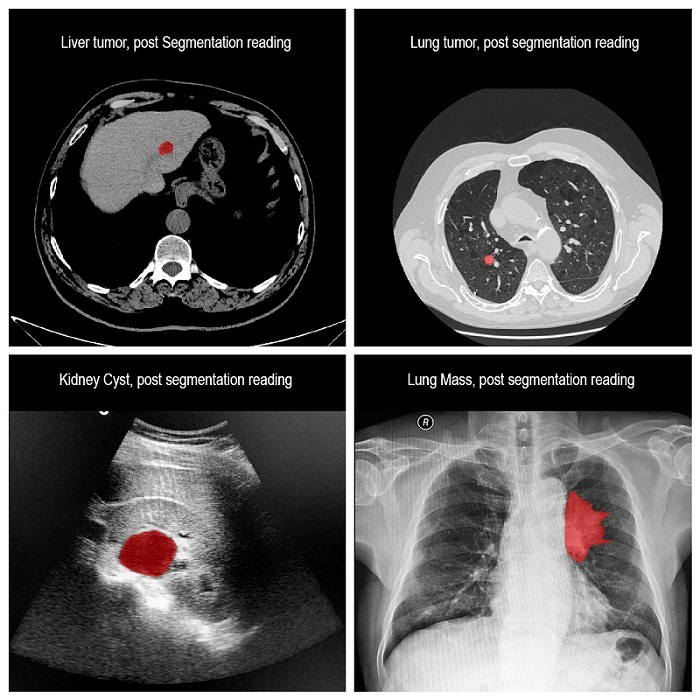

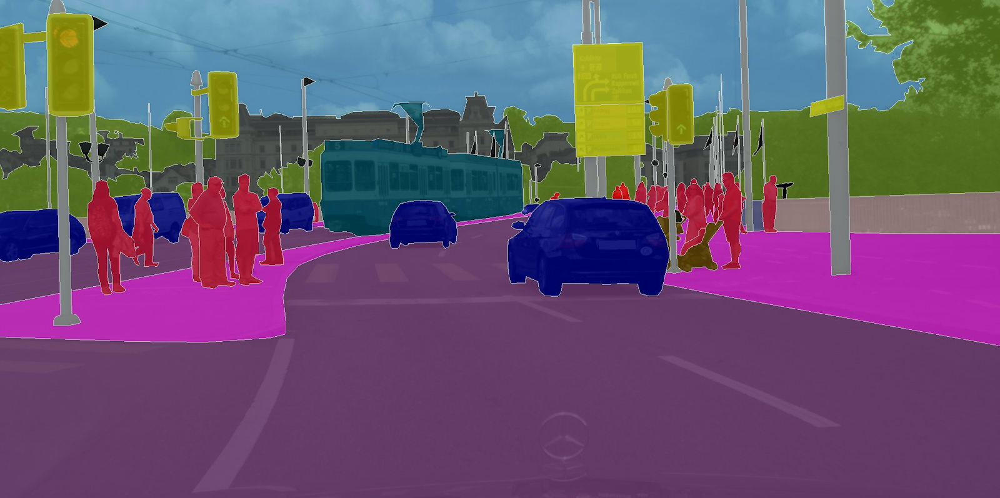

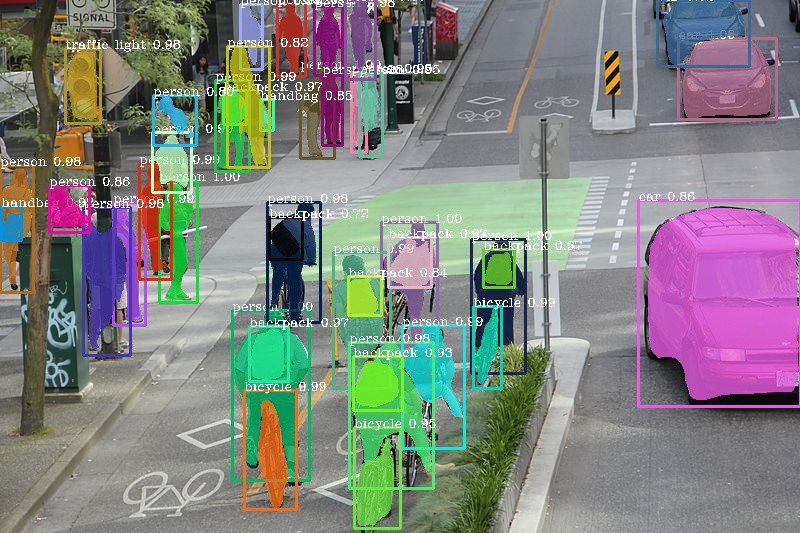

Например, на рисунке ниже представлены результаты сегментации изображений популярной модели глубокого обучения **U-net**. Задачу сегментации изображения можно сформулировать как задачу классификации пикселей с помощью семантических меток (semantic segmentation) или разделения отдельных объектов (instance segmentation).

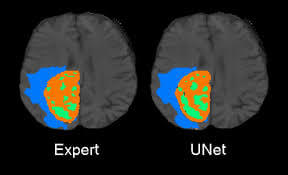

**Семантическая сегментация** выполняет разделение объектов на уровне пикселей (например, человек, автомобиль, дерево, небо) для всех пикселей изображения, поэтому обычно это более сложная задача, чем классификация изображений, которая предсказывает одну метку для всего изображения. Сегментация экземпляров расширяет область семантической сегментации, обнаруживая и отделяя каждый объект на изображении (например, разделение отдельных людей, зверей).


Формально задача выглядит следующим образом ↓

Возьмём картинку в пространстве RGB (height×width×3) или чёрно-белую (height×width×1) и вернём сегментационную карту (**segmentation map**), в которой каждый пиксель — это класс типа int (height×width×1).

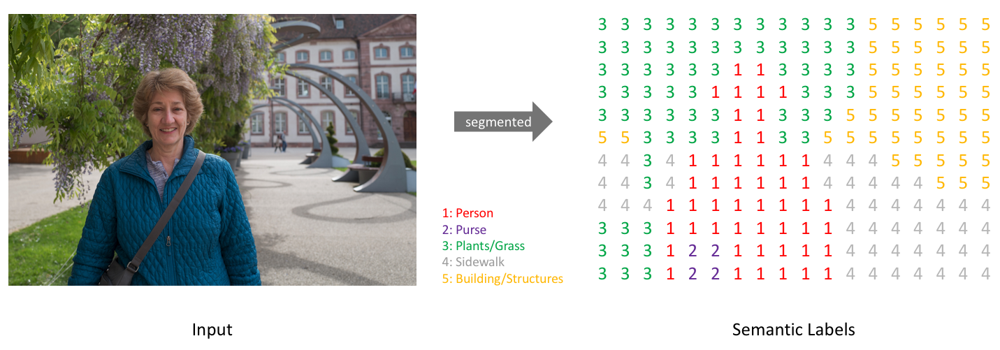

Дополнительно мы можем предсказывать (height width n), где n — количество классов и каналов:

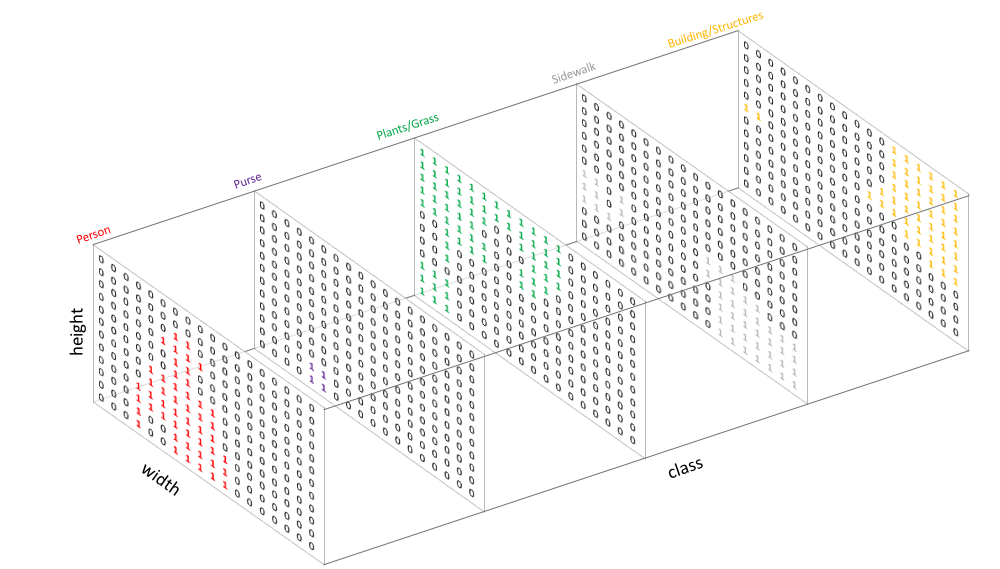

В данном случае вместо 1 и 0 модель чаще всего выдаёт вероятность нахождения данного класса в конкретном пикселе.



## <center>Базовые типы сегментации
## <center>Бинаризация
>**Бинаризация изображения** — это процесс преобразования изображения из серого (0-256) в чёрно-белое (0, 1), что существенно сокращает информацию, содержащуюся в изображении, с 256 оттенков серого до 2.

Часто это называется **установлением порога** для изображения, хотя при установлении порога могут создаваться изображения с несколькими сегментами (один объект лежит до 125, другой — выше 125). Такая сегментация, при которой изображение делится на составляющие объекты, обычно выполняется при попытке извлечь объект из изображения. Однако, как и многие операции обработки изображений, это нетривиально и зависит исключительно от содержимого изображения.

Давайте возьмём картинку с монетой, переведём её в серую, после чего выберем порог на гистограмме:

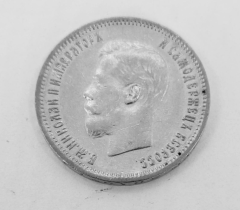

Вероятно, оптимальная граница будет лежать около 180.

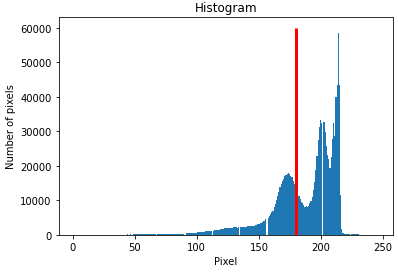

Результат:

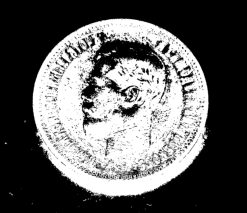

Но если столкнемся с изображением вроде этого, то при бинаризации получим следующее:

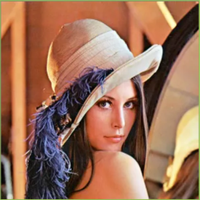
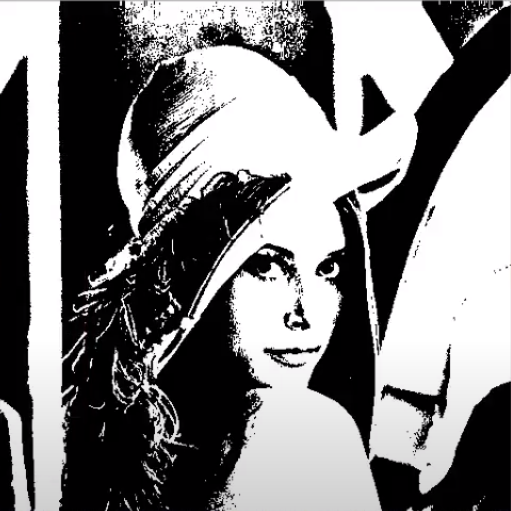

К сожалению, отделить девушку от фона тут никак не получится.

### <center>INSTANCE- И SEMANTIC-СЕГМЕНТАЦИЯ
>**Семантическая сегментация** — это процесс присвоения метки каждому пикселю изображения.

Это резко контрастирует с классификацией, когда всему изображению присваивается одна метка.

**Семантическая сегментация** рассматривает несколько объектов одного класса как **одну сущность**.

С другой стороны, **сегментация экземпляров** рассматривает несколько объектов одного класса как **отдельные индивидуальные объекты** (или экземпляры). Обычно сегментация экземпляров (**instance**) сложнее семантической.

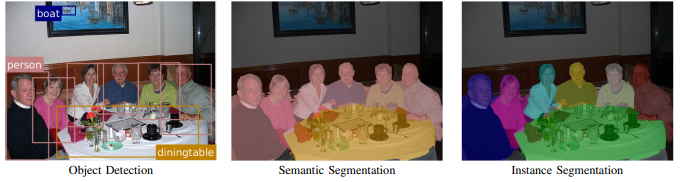

### <center>IMAGE MATTING

>**Image matting**, или **матирование** — это процесс разделения изображения на передний план и фон.

Он используется для объединения переднего плана и, например, нового фона.

Матирование — ключевая техника, лежащая в основе эффекта зелёного экрана (хромакей), и она широко используется в производстве видео, в графике и потребительских приложениях.

Чтобы смоделировать эту проблему, мы представляем каждый пиксель в захваченном изображении как оптимальную линейную комбинацию переднего плана и фона:

$$ I_i = \alpha_i F_i + (1 - \alpha_i)B_i $$

где $\alpha \in [0, 1]$ — коэффициент комбинации, который определяет прозрачность каждого пикселя, $F_i$ — пиксель переднего плана, $B_i$ — пиксель фона, $I_i$ — пиксель изображения.

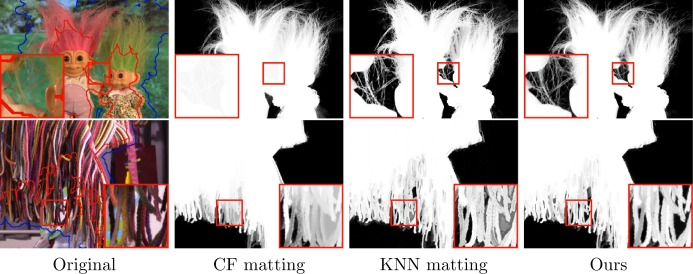

Зачем нужно матирование? Почему бы просто не использовать сегментацию?

Хотя в последние годы сегментация достигла огромных успехов, она не решает полного уравнения матирования. Сегментация присваивает двоичную метку (0,1) каждому пикселю, чтобы отделить передний план и фон, вместо решения для непрерывного $\alpha$-значения. Эффект от этого упрощения виден в следующем примере:

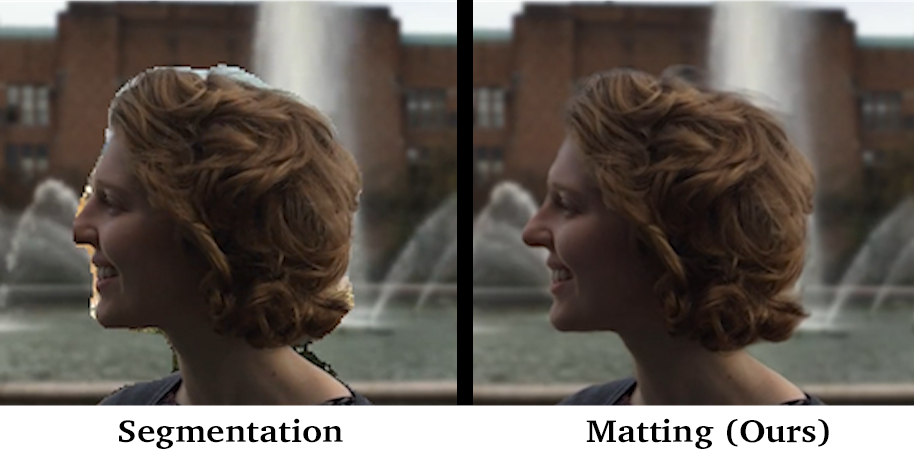

Области по краю изображения, особенно в волосах, имеют истинное значение $\alpha$ от 0 до 1. Следовательно, бинарный характер сегментации создаёт резкую границу вокруг переднего плана, оставляя видимые артефакты. Решение для частичной прозрачности и цвета переднего плана позволяет значительно улучшить фото во втором кадре.



### <center>Данные и разметка
### <center>INSTANCE SEGMENTATION
Для удобства возьмём ТОП-3 датасетов

#### COCO

>**MS COCO** — это крупномасштабный набор данных для детекции и сегментации, опубликованный *Microsoft*.

Инженеры по машинному обучению и компьютерному зрению широко используют набор данных COCO для различных проектов компьютерного зрения. Понимание визуальных сцен — основная цель компьютерного зрения: она включает в себя распознавание присутствующих объектов, локализацию объектов в 2D и 3D, определение атрибутов объекта и характеристики отношений между объектами.

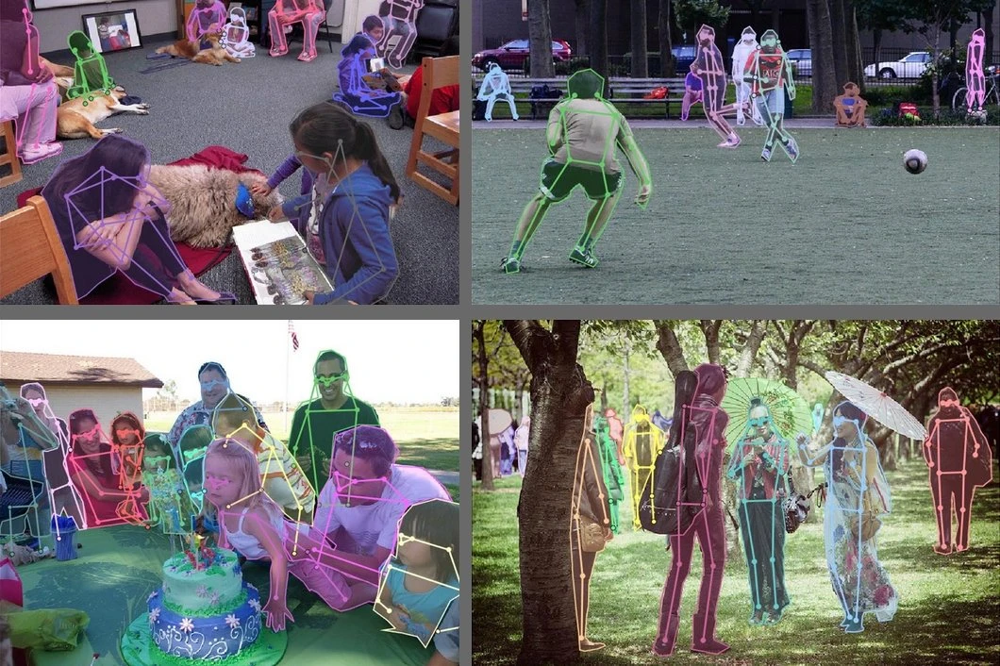

#### CITYSCAPES

>**CityScapes** — это крупномасштабный датасет, который содержит разнообразный набор стереофонических видеопоследовательностей, записанных в уличных сценах из 50 разных городов, с высококачественными аннотациями на уровне пикселей 5 000 кадров в дополнение к большему набору из 20 000 слабо размеченных кадров.

Как и COCO, набор данных Cityscapes предназначен для оценки производительности алгоритмов видения для основных задач семантического понимания городской сцены:

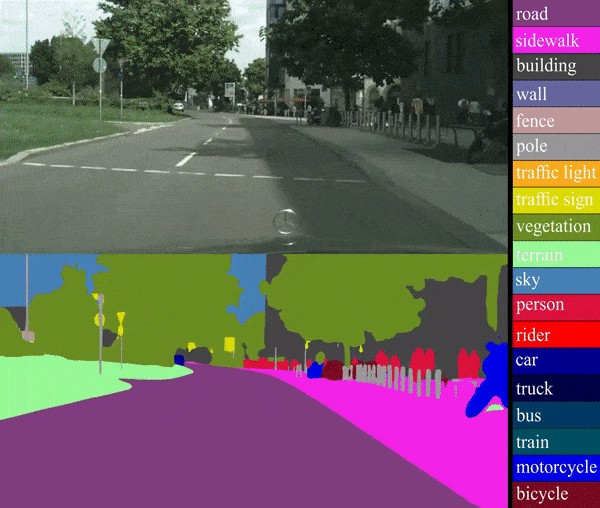

#### ISAID

>Датасет **iSAID** содержит 655 451 экземпляр объектов из 15 категорий в 2 806 изображениях.

Изображения iSAID в основном собираются из Google Earth, некоторые из них сделаны со спутника JL-1, другие — со спутника GF-2.

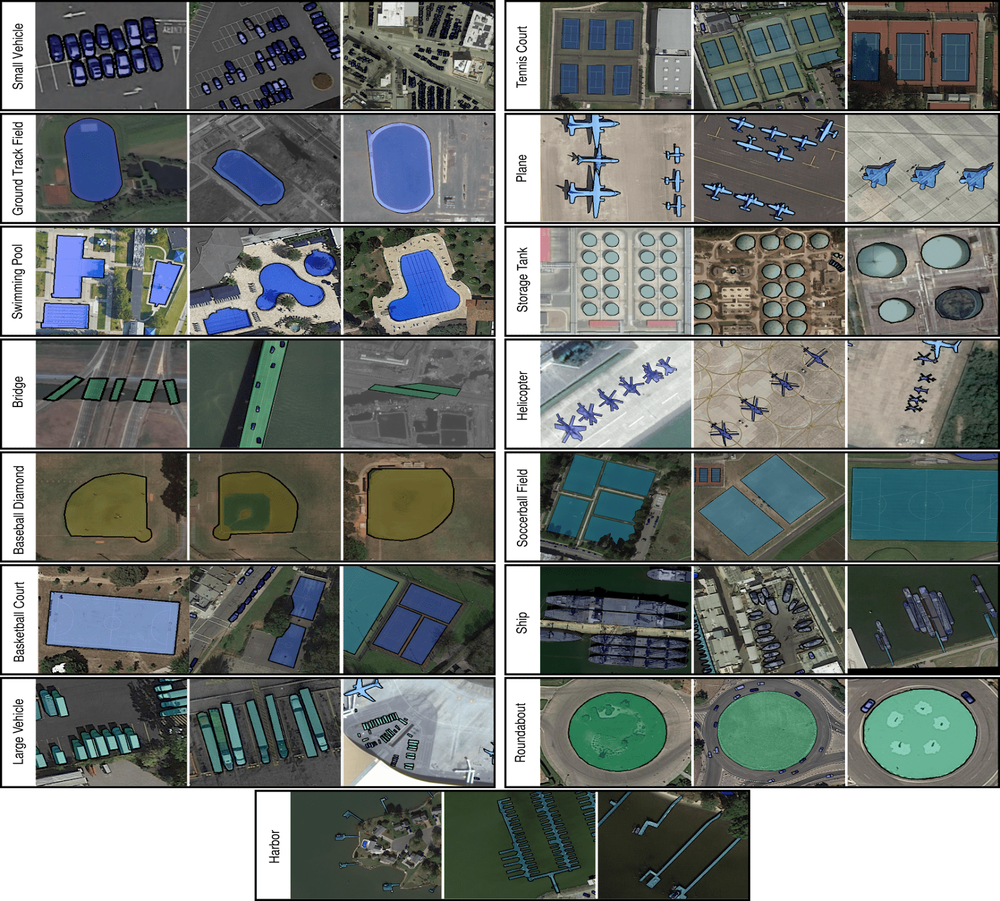

### <center>SEMANTIC SEGMENTATION
#### PASCAL VOC

>Набор данных **PASCAL Visual Object Classes (VOC) 2012** содержит 20 категорий объектов, включая транспортные средства, объекты домашнего хозяйства, животных и прочее (самолеты, велосипеды, лодки, автобусы, автомобили, мотоциклы, поезда, бутылки, стулья и т. д.).

Какие-то классы пересекаются в том числе и с COCO.

#### ADE20K

>Датасет **ADE20K** состоит из более чем 27 тысяч изображений из баз данных SUN и Places.

Изображения полностью размечены объектами, охватывающими более 3 тысяч категорий. Многие изображения также содержат части объектов и части частей объектов.

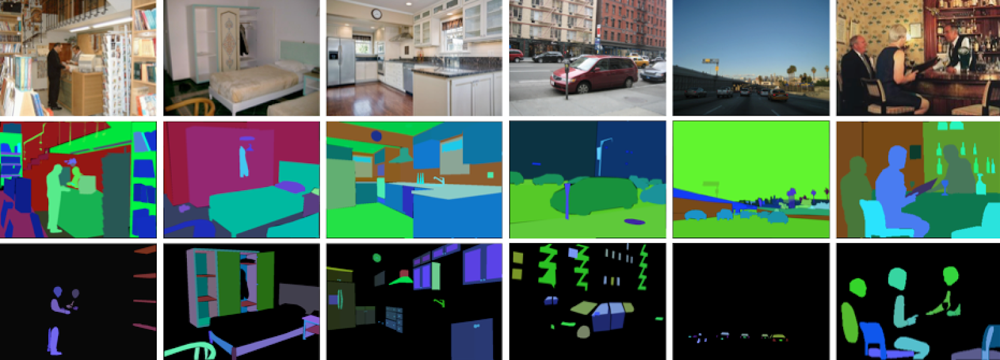



### <center>Loss-функции и метрики
Наиболее часто используемая функция потерь для задачи сегментации изображений — это **кросс-энтропия (cross entropy)**. Эта функция потерь исследует каждый пиксель индивидуально, сравнивая предсказания класса с целевым вектором.

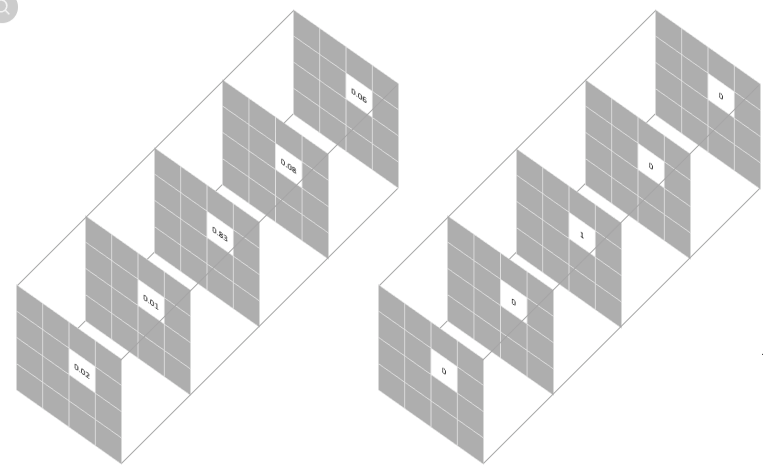

>**Кросс-энтропия** определяется как мера разницы между двумя распределениями вероятностей для данной случайной величины или набора событий.

Она широко используется для целей классификации, в случае с сегментацией (классификация на уровне пикселей) кросс-энтропия работает хорошо.

Бинарная кросс-энтропия определяется так:

$$ L_{BCE} = - (y \log (\hat{y}) + (1 - y) \log (1-\hat{y})) $$
где $\hat{y}$ - наше предсказание.

### FOCAL LOSS

>**Focal Loss** можно рассматривать как разновидность бинарной кросс-энтропии. FL снижает вес простых примеров и позволяет модели больше сосредоточиться на изучении сложных. Он хорошо работает для сценариев, где сильно несбалансированная выборка.

Давайте посмотрим, как считается FL. Возьмём обычную кросс-энтропию с ограничениями:

$$
CE = \begin{cases}
-\log(p), & \text{if } y = 1 \\
-\log(1-p), & \text{otherwise}
\end{cases}
$$
Чтобы обозначения были удобнее, Focal Loss определяет предполагаемую вероятность класса так:
$$
p_t = \begin{cases}
p, & \text{if } y = 1 \\
1-p, & \text{otherwise}
\end{cases}
$$

Следовательно, формулу кросс-энтропии можно переписать таким образом:
$$ CE(p, y) = CE(p_t) = -log(p_t) $$
Так как FL снижает вес простых примеров, нам нужен дополнительный фактор:
$$ FL(p_t) = -\alpha_t (1-p_t)^{\gamma} \log(p_t) $$

Здесь $\gamma > 0$. Когда $\gamma = 1$, Focal Loss будет работать как кросс-энтропия. Также $\alpha$ находится между $[0,1]$ — она может быть установлена с помощью частоты обратного класса или просто как гиперпараметр. Вот график, показывающий наглядно, как работает Focal Loss:

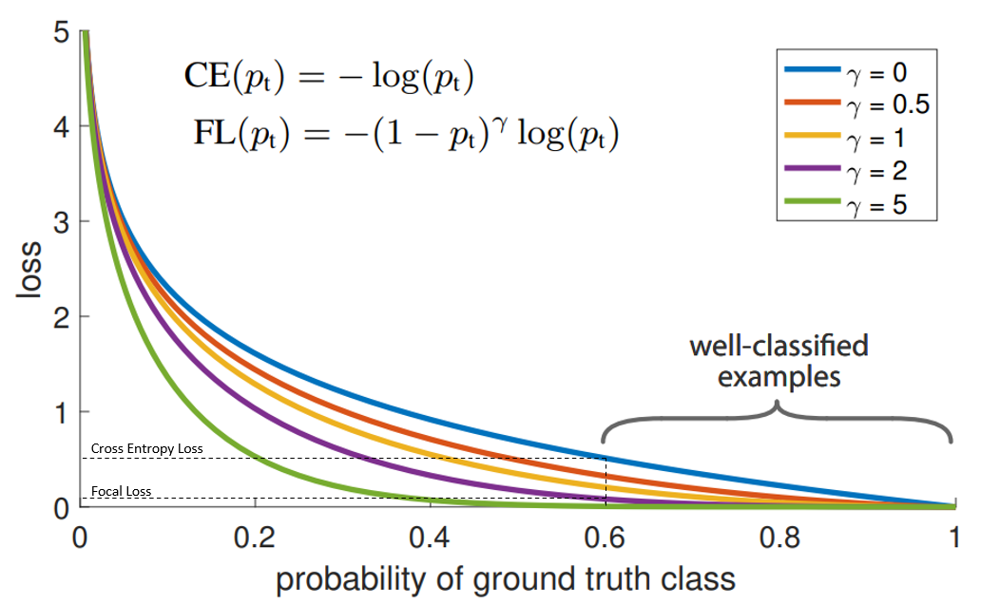

Из него следует, что на простых примерах ошибка действительно меньше, чем на более сложных.  следует выбирать аккуратно, чтобы не было оверфита хорошо распознанных примеров.

### DICE LOSS

>**Коэффициент Дайса** — широко используемый в сообществе специалистов по CV показатель для вычисления сходства между двумя изображениями. В 2016 году он был адаптирован как функция потерь, известная как **Dice Loss**.
$$ DL(y, \hat{p}) = 1 - \frac{2y\hat{p} + 1}{y + \hat{p} + 1} $$
Мы добавляем один числитель и знаменатель, чтобы убедиться в том, что функция не будет не определена в значениях, где $y=\hat{p}=0$.

Отметим, что также есть комбинации из loss-функций — для YOLO или Fast R-CNN loss-функция выглядит примерно так:
$$ L = L_{cls} + L_{box} $$
Если мы хотим добавить маску, то просто добавляем бинарную кросс-энтропию:
$$ L = L_{cls} + L_{box} - \frac{1}{m^2} \sum_{1 \leq i,j \leq m} \Big[y_{ij} \log(\hat{y}^k_{ij}) + (1 - y_{ij}) \log(1 - \hat{y^k_{ij}}) \Big] $$
Таким образом:

* **Cross-entropy** хорошо работает на сбалансированных данных.

* **Focal Loss** работает на несбалансированном датасете.

* **Dice Loss** отлично подходит для маленьких объектов в выборке, находящихся рядом с большими.


### <center>МЕТРИКИ SEMANTIC SEGMENTATION
#### PIXEL ACCURACY

Это самая простая в понимании метрика, она отвечает на вопрос «Сколько пикселей из всех было классифицировано правильно?».

Давайте рассмотрим пример задачи семантической сегментации на спутниковых снимках, справа — исходные примеры:

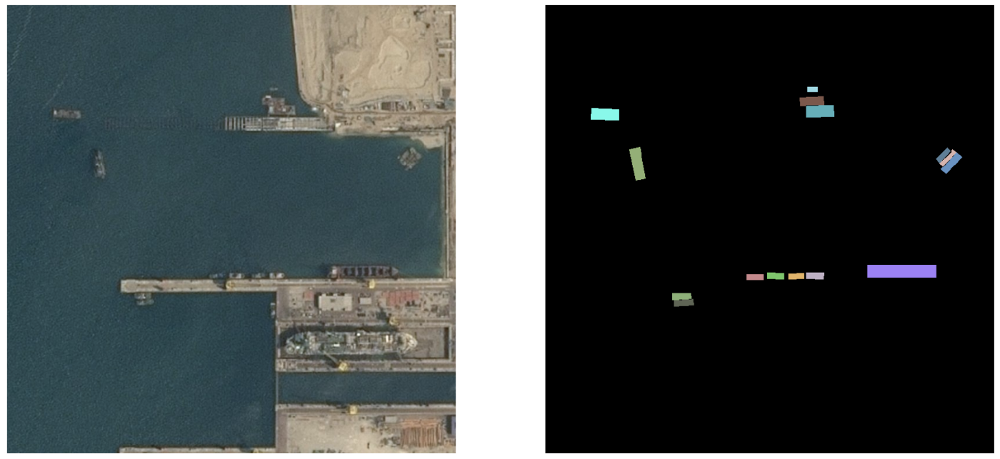

Допустим, мы обучили модель, loss маленький, точность равна 95 %, но теперь мы хотим проверить, какие предсказания выдаёт нейросеть:

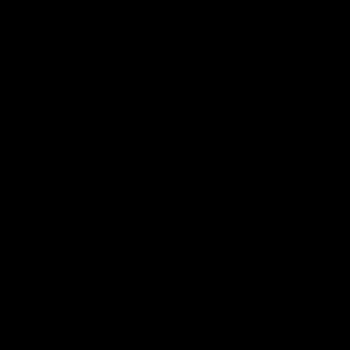

Что же произошло? на самом деле здесь всё верно — просто один класс составлял 95 % исходного изображения. Таким образом, если модель классифицирует все пиксели как этот класс, 95 % пикселей классифицируются точно, а остальные 5 % — нет. В результате, хотя точность составляет 95 %, модель возвращает совершенно бесполезный прогноз.

Но есть и альтернативы, и с одной из них вы знакомились в предыдущем модуле — это IoU или Jaccard Index. Напомним, данная метрика показывает, на сколько (от 0 до 1) ваше предсказание заполняет эталонное:

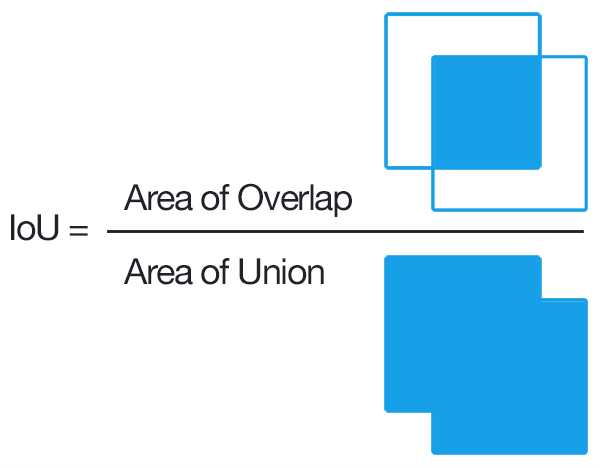

Формально IoU выглядит так:

$$ IOU(A,B) = \frac{|A \cap B|}{A \cup B} $$

#### DICE COEFFICIENT
Коэффициент Дайса (также известный как коэффициент Соренсена – Дайса, и оценка F1) определяется как удвоенная площадь пересечения A и B, делённая на сумму площадей A и B:

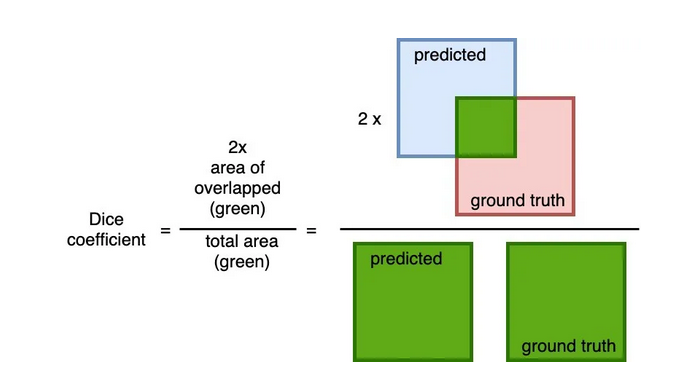

Формально он выглядит так:
$$ dice(A,B) = \frac{2|A\cap B|}{|A| + |B|} $$

**В чём между ними разница?** Метрика **IoU** имеет тенденцию наказывать отдельные случаи неправильной классификации больше, чем Dice — количественно, даже когда обе метрики могут согласиться с тем, что это предсказание плохое (подобно тому, как L2 наказывает сильнее, чем L1). Таким образом, метрика **Dice** имеет тенденцию измерять ближе к среднему качеству модели, в то время как IoU измеряет ближе к наихудшему случаю.

Предположим, что подавляющее большинство предсказаний умеренно лучше с классификатором A, чем с B, но некоторые из них значительно хуже при использовании классификатора A. В таком случае может оказаться так, что метрика Dice поддерживает классификатор A, тогда как метрика IoU поддерживает классификатор B. Безусловно, обе эти метрики больше похожи, чем различны.

### <center>МЕТРИКИ INSTANCE SEGMENTATION

Поскольку мы уже знакомы с большинством метрик, можно сказать, что в этой задаче чаще всего используют метрики из задачи детекции объектов, например *mIoU*, *mAP*, *Recall*, *F1* и т. д.

Ниже представлен пример использования *Confusion Matrix*:

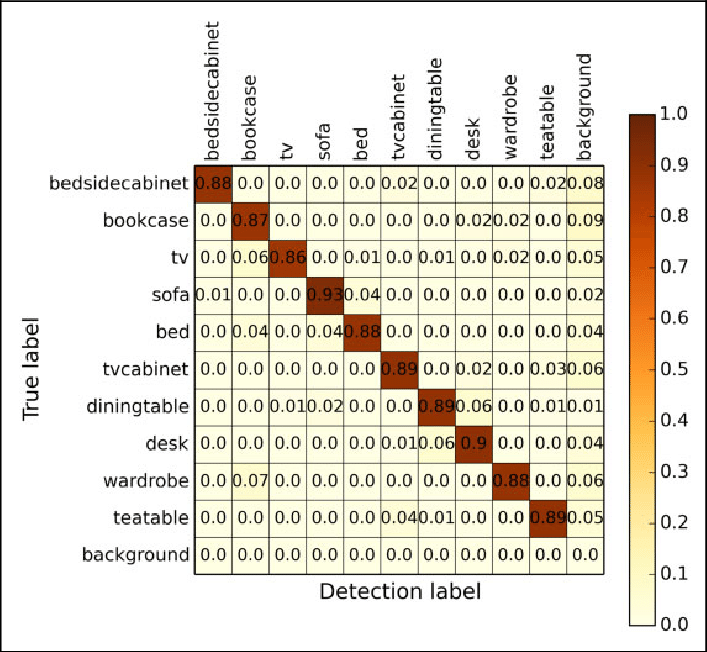

Эта матрица даёт наилучшее понимание того, что может быть не так. Например, `teatable` принимается за `diningtable` в соотношении 20:80. Для исправления ситуации мы просто добираем `teatable`, уменьшаем количество `diningtable` или взвешиваем классы. В обучении лучше использовать что-то простое (*mAP* и *mIoU*) и уже после смотреть на матрицу, чтобы понять, как работает модель.

